# Preamble

In [1]:
import Pkg;
Pkg.add("ForwardDiff"); 
Pkg.add("Plots"); 
Pkg.add("LaTeXStrings"); 
Pkg.add("DifferentialEquations"); 
Pkg.add("Roots"); 
Pkg.add("QuadGK"); 
Pkg.add("HCubature");
Pkg.add("MultiQuad");
Pkg.add("DataInterpolations");
Pkg.add("Dierckx");
Pkg.add("SpecialFunctions");
Pkg.add("LinearAlgebra");
Pkg.add("DelimitedFiles");

   Resolving package versions...
     Project No packages added to or removed from `~/.julia/environments/v1.12/Project.toml`
    Manifest No packages added to or removed from `~/.julia/environments/v1.12/Manifest.toml`
   Resolving package versions...
     Project No packages added to or removed from `~/.julia/environments/v1.12/Project.toml`
    Manifest No packages added to or removed from `~/.julia/environments/v1.12/Manifest.toml`
   Resolving package versions...
     Project No packages added to or removed from `~/.julia/environments/v1.12/Project.toml`
    Manifest No packages added to or removed from `~/.julia/environments/v1.12/Manifest.toml`
   Resolving package versions...
     Project No packages added to or removed from `~/.julia/environments/v1.12/Project.toml`
    Manifest No packages added to or removed from `~/.julia/environments/v1.12/Manifest.toml`
   Resolving package versions...
     Project No packages added to or removed from `~/.julia/environments/v1.12/Project.

In [1]:
using ForwardDiff, Plots, LaTeXStrings, DifferentialEquations, Roots, QuadGK, HCubature, MultiQuad, DataInterpolations, Dierckx, SpecialFunctions, LinearAlgebra, DelimitedFiles
default(framestyle=:box, guidefont=font(14), titlefont=font(14), tickfont=font(12), legend_font=font(12), legend=false, linewidth=3)

In [3]:
Mpl = 2.435e18 # reduced Planck mass in GeV
c = 299792458 # speed of light in m/s
KinGeV = (1.160e4)^-1 * 10^-9 # Kelvin in GeV
Mpcinm = 3.086e16 * 10^6 # Mpc in m
GeVinminv = 10^9/(1.973e-7) # GeV in m^-1
GeVinMpcinv = GeVinminv * Mpcinm # GeV in Mpc^-1
MpcinvinHz = c/Mpcinm # Mpc^inv in Hz
yrins = 365.2422 * 24 * 60 * 60 # yr in s

Or0h2 = 4.2e-5 # current radiation density parameter * h^2
Hubblh = 0.674 # normalised Hubble parameter h

T0 = 2.725*KinGeV # current temperature
grho0 = 3.383 # current grho
gs0 = 3.931 # current gs

3.931

In [5]:
Threads.nthreads()

8

# Background

## calculation

In [7]:
ai = [1, 1.11724, 3.12672e-1, -4.68049e-2, -2.65004e-2, -1.19760e-3, 1.82812e-4, 1.36436e-4, 8.55051e-5, 1.22840e-5, 3.82259e-7, -6.87035e-9];
bi = [1.43382e-2, 1.37559e-2, 2.92108e-3, -5.38533e-4, -1.62496e-4, -2.87906e-5, -3.84278e-6, 2.78776e-6, 7.40342e-7, 1.17210e-7, 3.72499e-9, -6.74107e-11];
ci = [1, 6.07869e-1, -1.54485e-1, -2.24034e-1, -2.82147e-2, 2.90620e-2, 6.86778e-3, -1.00005e-3, -1.69104e-4, 1.06301e-5, 1.69528e-6, -9.33311e-8];
di = [7.07388e1, 9.18011e1, 3.31892e1, -1.39779, -1.52558, -1.97857e-2, -1.60146e-1, 8.22615e-5, 2.02651e-2, -1.82134e-5, 7.83943e-5, 7.13518e-5];

In [9]:
Tth = 0.12; # temperature separation in GeV

In [11]:
grhohigh(T) = sum([ai[i]*log(T)^(i - 1) for i=1:12]) / sum([bi[i]*log(T)^(i - 1) for i=1:12]); # eff. DoF for energy density for T > 0.12 GeV
gshigh(T) = grhohigh(T) / (1 + sum([ci[i]*log(T)^(i - 1) for i=1:12]) / sum([di[i]*log(T)^(i - 1) for i=1:12])); # eff. DoF for entropy for T > 0.12 GeV

In [13]:
rhohigh(T) = π^2/30*grhohigh(T)*T^4; # energy density for T > 0.12 GeV
shigh(T) = 2*π^2/45*gshigh(T)*T^3; # entropy for T > 0.12 GeV
phigh(T) = T*shigh(T) - rhohigh(T); # pressure for T > 0.12 GeV

In [15]:
# some fitting functions
Sfit(x) = 1 + 7/4*exp(-1.0419*x) * (1 + 1.034*x + 0.456426*x^2 + 0.0595249*x^3);
frho(x) = exp(-1.04855*x) * (1 + 1.03757*x + 0.508630*x^2 + 0.0893988*x^3);
brho(x) = exp(-1.03149*x) * (1 + 1.03317*x + 0.398264*x^2 + 0.0648056*x^3);
fs(x) = exp(-1.04190*x) * (1 + 1.03400*x + 0.456426*x^2 + 0.0595248*x^3);
bs(x) = exp(-1.03365*x) * (1 + 1.03397*x + 0.342548*x^2 + 0.0506182*x^3);

In [17]:
# mass params. in GeV
me = 511e-6;
mmu = 0.1056;
mpi0 = 0.13;
mpipm = 0.140;
m1 = 0.5;
m2 = 0.77;
m3 = 1.2;
m4 = 2;

In [19]:
# neutrino temperature
Tnu(T) = (4/11)^(1/3) * Sfit(me/T)^(1/3) * T;

In [21]:
grhogammalow(T) = 2.030 + 3.495*frho(me/T) + 3.446*frho(mmu/T) + 1.05*brho(mpi0/T) + 2.08*brho(mpipm/T) + 4.165*brho(m1/T) + 30.55*brho(m2/T) + 89.4*brho(m3/T) + 8209*brho(m4/T); # eff. DoF for photon energy density for T < 0.12 GeV
gsgammalow(T) = 2.008 + 3.442*fs(me/T) + 3.468*fs(mmu/T) + 1.034*bs(mpi0/T) + 2.068*bs(mpipm/T) + 4.16*bs(m1/T) + 30.55*bs(m2/T) + 90*bs(m3/T) + 6209*bs(m4/T); # eff. DoF for photon entropy for T < 0.12 GeV
grhonulow(T) = 1.353*Sfit(me/T)^(4/3); # eff. DoF for neutrino energy density for T < 0.12 GeV
gsnulow(T) = 1.923*Sfit(me/T); # eff. DoF for neutrino entropy for T < 0.12 GeV

In [23]:
# T < 0.12 GeV
rhogammalow(T) = π^2/30*grhogammalow(T)*T^4; # photon energy density
sgammalow(T) = 2*π^2/45*gsgammalow(T)*T^3; # photon entropy
rhonulow(T) = π^2/30*grhonulow(T)*T^4; # neutrino energy density
snulow(T) = 2*π^2/45*gsnulow(T)*T^3; # neutrino entropy
pgammalow(T) = T*sgammalow(T) - rhogammalow(T); # photon pressure
pnulow(T) = Tnu(T)*snulow(T) - rhonulow(T); # neutrino pressure
rholow(T) = rhogammalow(T) + rhonulow(T); # total energy density
plow(T) = pgammalow(T) + pnulow(T); # total pressure

In [25]:
function grho(T) # eff. DoF for energy density
    if T >= Tth
        return grhohigh(T)
    else
        return grhogammalow(T) + grhonulow(T)
    end
end;

function grhop(T) # T-derivative of grho
    if T >= Tth
        return ForwardDiff.derivative(grhohigh,T)
    else
        return ForwardDiff.derivative(grhogammalow,T) + ForwardDiff.derivative(grhonulow,T)
    end
end;

function gs(T) # eff. DoF for entropy
    if T >= Tth
        return gshigh(T)
    else
        return gsgammalow(T) + gsnulow(T)
    end
end;

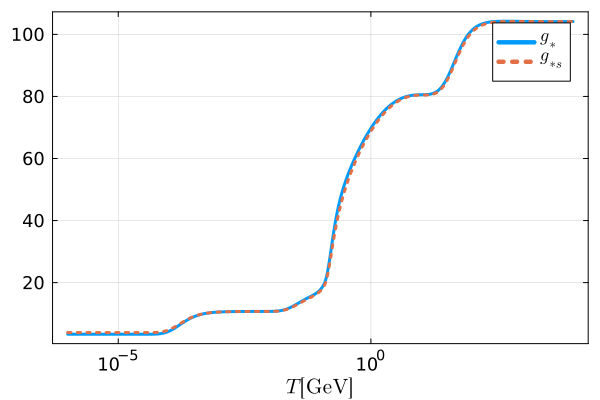

In [27]:
Tlist = [10^i for i=-6:0.01:4]
plot(grho, Tlist, xscale=:log10, label=L"$g_*$", xlabel=L"$T\,[\mathrm{GeV}]$", legend=true)
plot!(gs, Tlist, label=L"$g_{*s}$", linestyle=:dot)

In [28]:
function rho(T) # energy density
    if T >= Tth
        return rhohigh(T)
    else 
        return rholow(T)
    end
end;

function press(T) # pressure
    if T >= Tth
        return phigh(T)
    else
        return plow(T)
    end
end;

In [31]:
EoSw(T) = press(T)/rho(T); # equation-of-state param. w

function cs2(T) # sound speed squared
    if T >= Tth
        return ForwardDiff.derivative(phigh,T)/ForwardDiff.derivative(rhohigh,T)
    else
        return ForwardDiff.derivative(plow,T)/ForwardDiff.derivative(rholow,T)
    end
end;

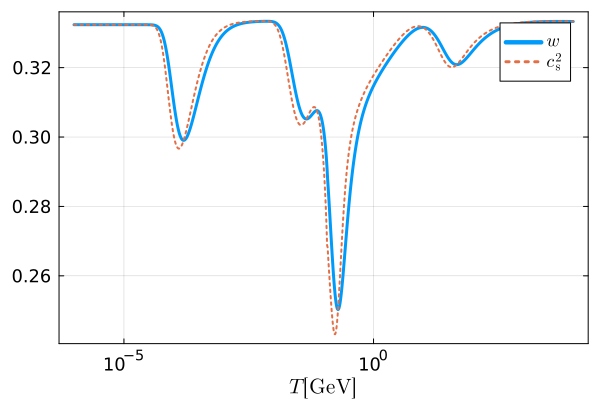

In [33]:
plot(EoSw, Tlist, xscale=:log10, label=L"$w$", xlabel=L"$T\,[\mathrm{GeV}]$", legend=true)
plot!(cs2, Tlist, label=L"$c_\mathrm{s}^2$", linestyle=:dot, linewidth=:2)

In [35]:
T0 = 2.725*KinGeV; # current temperature
grho0 = grho(T0); # current grho
gs0 = gs(T0); # current gs

In [37]:
calH(T, scalea) = scalea * sqrt(rho(T)/3/Mpl^2) * GeVinMpcinv; # conformal Hubble in Mpc^-1

In [39]:
Ti = 1e6; # initial temperature
scaleai = (gs0/gs(Ti))^(1/3)*T0/Ti; # temporal initial scale factor 
etai = 1/calH(Ti, scaleai); # initial conformal time

etaf = 10; # final conformal time

In [41]:
etai

5.842207902333349e-14

In [43]:
function bgEoM(du,u,p,lneta) # u[1] = T, u[2] = scalea
    du[1] = -3*exp(lneta)*(1 + EoSw(u[1])) * calH(u[1], u[2]) * grho(u[1]) / (grhop(u[1]) + 4*grho(u[1])/u[1])
    du[2] = exp(lneta)*u[2]*calH(u[1],u[2])
end;

ui = [Ti,scaleai];
lnetaspan = (log(etai),log(etaf));
bgprob = ODEProblem(bgEoM,ui,lnetaspan);
@time bgsol = solve(bgprob,Tsit5(),reltol=1e-10,abstol=1e-10);

  0.497088 seconds (6.30 M allocations: 176.291 MiB, 5.61% gc time, 71.97% compilation time)


In [45]:
Tsol(eta) = bgsol(log(eta))[1];
asol(eta) = bgsol(log(eta))[2];

In [47]:
norm = Tsol(etaf)/T0*asol(etaf); # renormalisation factor so that a0 = 1
anorm(eta) = asol(eta/norm)/norm; # renormalised scale factor
Tnorm(eta) = Tsol(eta/norm); # T with the renormalised eta
calHnorm(eta) = calH(Tnorm(eta), anorm(eta)); # calH with the renormalised eta
rhoQnorm(eta) = rho(Tnorm(eta))^(1/4)
af = anorm(norm*etaf); # renormalised scale factor at the final time
calHf = calHnorm(norm*etaf); # calH at the final time

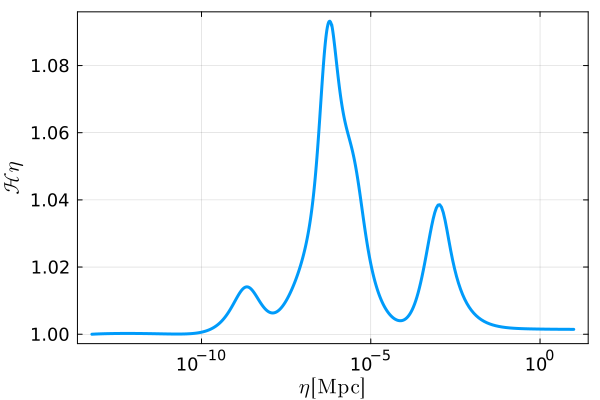

In [49]:
etalist = [norm*exp(i) for i in bgsol.t];
plot(etalist, map(x -> x*calHnorm(x), etalist), xscale=:log10, xlabel=L"$\eta\,[\mathrm{Mpc}]$", ylabel=L"$\mathcal{H}\eta$", legend=false)

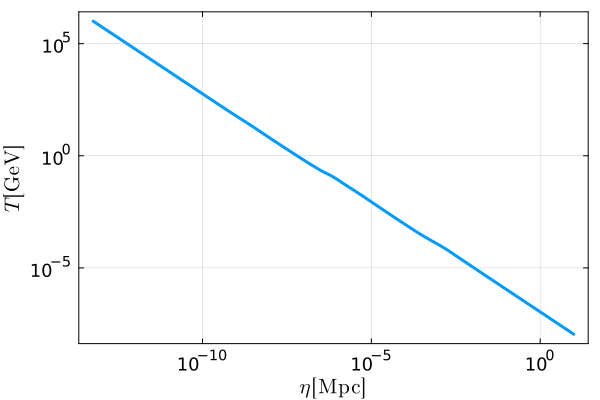

In [51]:
plot(Tnorm, etalist, xscale=:log10, yscale=:log10, xlabel=L"$\eta\,[\mathrm{Mpc}]$", ylabel=L"$T\,[\mathrm{GeV}]$", legend=false)

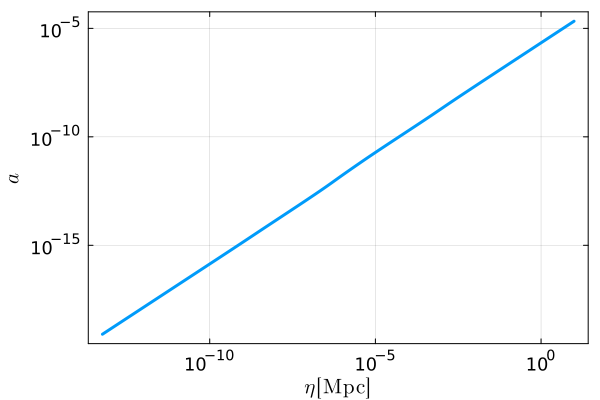

In [53]:
plot(anorm, etalist, xscale=:log10, yscale=:log10, xlabel=L"$\eta\,[\mathrm{Mpc}]$", ylabel=L"$a$", legend=false)

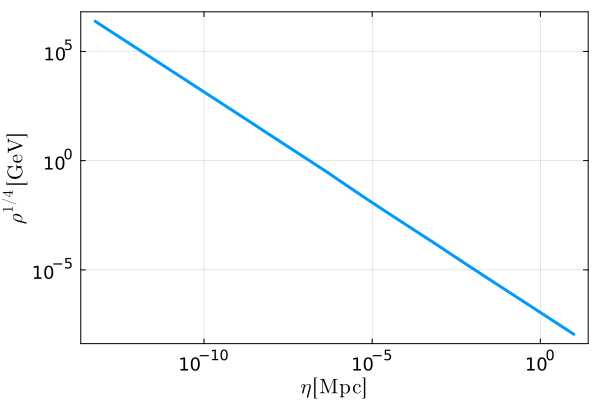

In [55]:
plot(rhoQnorm, etalist, xscale=:log10, yscale=:log10, xlabel=L"$\eta\,[\mathrm{Mpc}]$", ylabel=L"$\rho^{1/4}\,[\mathrm{GeV}]$")

In [57]:
EoSwsol(eta) = EoSw(Tnorm(eta));
cs2sol(eta) = cs2(Tnorm(eta));
grhosol(eta) = grho(Tnorm(eta));
gssol(eta) = gs(Tnorm(eta));

In [59]:
rhoQis1e4(eta) = rhoQnorm(eta) - 1e4;
eta1e4 = find_zero(rhoQis1e4, (etai*norm,1e-9))

1.3990721570940032e-11

In [61]:
(rhoQnorm(eta1e4), EoSwsol(eta1e4), cs2sol(eta1e4))

(10000.0, 0.33331897239417774, 0.33332907441085485)

In [63]:
anorm(eta1e4)

1.9274322114658533e-17

In [65]:
anormList = [anorm(eta) for eta in etalist];
calHList = [calHnorm(eta) for eta in etalist];
EoSwList = [EoSwsol(eta) for eta in etalist];
cs2List = [cs2sol(eta) for eta in etalist];
grhoList = [grhosol(eta) for eta in etalist];
gsList = [gssol(eta) for eta in etalist];

In [67]:
writedlm("data/bg.csv", hcat(etalist,anormList,calHList,EoSwList,cs2List,grhoList,gsList), ',');

## load

In [11]:
bgdata = readdlm("data/bg.csv", ',');

etaList = bgdata[:,1];
anormList = bgdata[:,2];
calHList = bgdata[:,3];
EoSwList = bgdata[:,4];
cs2List = bgdata[:,5];
grhoList = bgdata[:,6];
gsList = bgdata[:,7];

In [21]:
lnetaList = log10.(etaList);
etai = etaList[1];
etaf = etaList[length(etaList)];

alneta = CubicSpline(anormList, lnetaList)
aint(eta) = alneta(log10(eta))
calHlneta = CubicSpline(calHList, lnetaList)
calHint(eta) = calHlneta(log10(eta));
EoSwlneta = CubicSpline(EoSwList, lnetaList);
EoSwint(eta) = EoSwlneta(log10(eta))
cs2lneta = CubicSpline(cs2List, lnetaList);
cs2int(eta) = cs2lneta(log10(eta));
grholneta = CubicSpline(grhoList, lnetaList);
grhoint(eta) = grholneta(log10(eta))
gslneta = CubicSpline(gsList, lnetaList);
gsint(eta) = gslneta(log10(eta));

In [23]:
(etai, etaf)

(5.780118551592031e-14, 9.89372279833361)

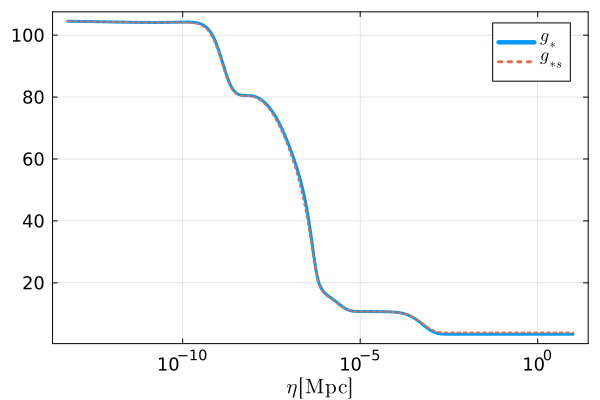

In [25]:
plot(grhoint, etaList, xscale=:log10, label=L"$g_*$", xlabel=L"$\eta\,[\mathrm{Mpc}]$", legend=true)
plot!(gsint, etaList, label=L"$g_{*s}$", linewidth=:2, linestyle=:dot)

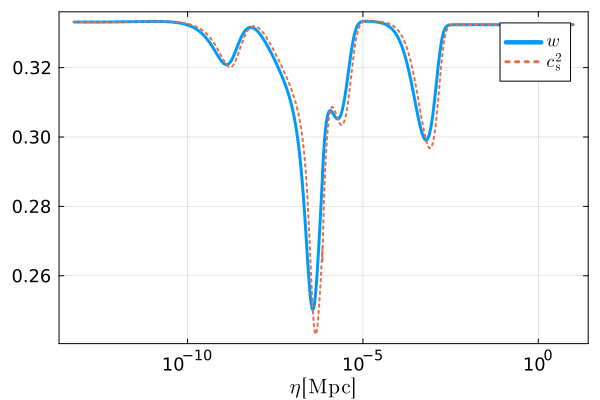

In [27]:
plot(EoSwint, etaList, xscale=:log10, label=L"$w$", xlabel=L"$\eta\,[\mathrm{Mpc}]$", legend=true)
plot!(cs2int, etaList, label=L"$c_\mathrm{s}^2$", linewidth=:2, linestyle=:dot)

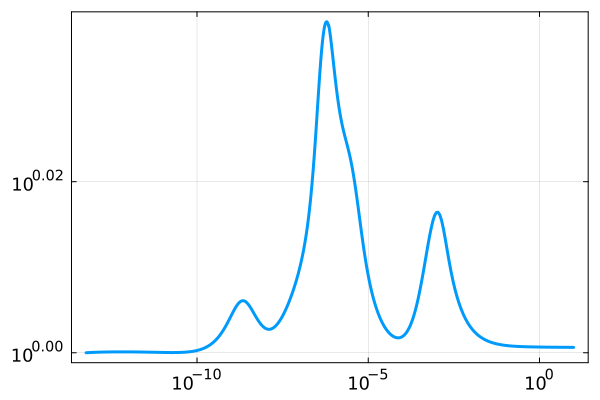

In [29]:
plot(etaList, map(x -> x*calHint(x), etaList), xscale=:log10, yscale=:log10)

In [31]:
(aint(400/1e5)*calHint(400/1e5)/aint(etaf)/calHint(etaf))^2

0.9773074441488482

In [33]:
etaf/aint(etaf)

463836.56092024385

In [35]:
2.4e4/0.07

342857.14285714284

# Scalar

## calculation

In [87]:
kmin = 1e4;
kmax = 1e9;
kList = [10^lnk for lnk=log10(kmin):0.01:log10(kmax)];

xi = 0.01;
xf = 1000; #400;

In [89]:
PhiRD(x) = 9/x^2 * (sin(x/sqrt(3))/(x/sqrt(3)) - cos(x/sqrt(3))); # Phi in exact RD
PhipRD(x) = ForwardDiff.derivative(PhiRD,x);

In [91]:
wsk2(k,eta) = cs2int(eta) + 3*calHint(eta)^2/k^2*(cs2int(eta) - EoSwint(eta));

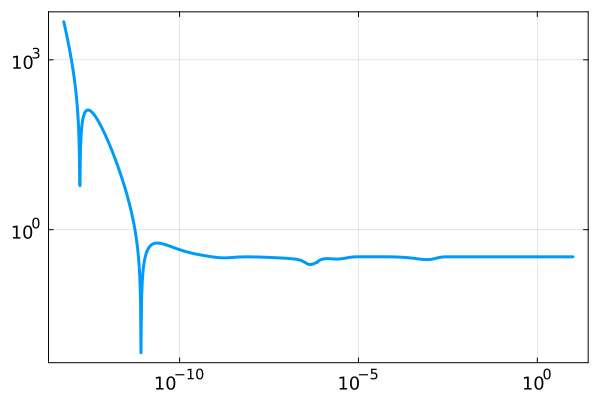

In [93]:
plot(etaList, map(x -> abs(wsk2(1e9,x)),etaList), xscale=:log10, yscale=:log10)

In [95]:
function scalarEoM(du,u,p,x) # u[i] = Phi, u[i+length(kList)] = dPhidx, p[i] = k
    for i=1:length(kList)
        eta = x/p[i]
        du[i] = u[i+length(kList)]
        du[i+length(kList)] = - 3*calHint(eta)/p[i]*(1 + cs2int(eta))*u[i+length(kList)] - wsk2(p[i],eta)*u[i]
    end
end;

ui = vcat([Float64(PhiRD(big(xi))) for i=1:length(kList)], [Float64(PhipRD(big(xi))) for i=1:length(kList)]);
xspan = (xi,xf);

scalarprob = ODEProblem(scalarEoM,ui,xspan,kList);

In [97]:
@time scalarsol = solve(scalarprob,Tsit5(),reltol=1e-10,abstol=1e-10);

 84.859529 seconds (950.86 M allocations: 14.992 GiB, 2.63% gc time, 0.23% compilation time)


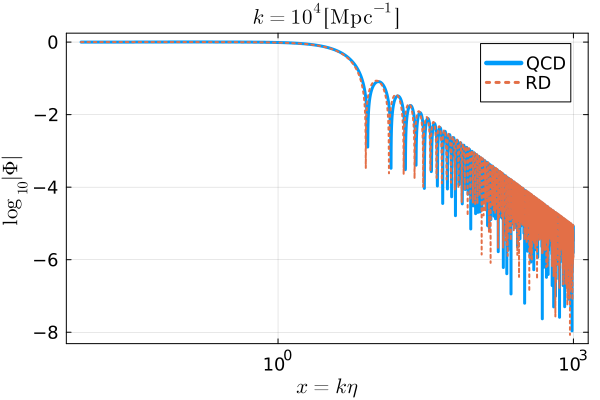

In [159]:
plot(scalarsol.t, log10.(abs.(hcat(scalarsol.u...)[1,:])), xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|\Phi|$", title=L"$k = 10^4\, [\mathrm{Mpc}^{-1}]$", label="QCD", legend=true)
plot!(scalarsol.t, map(x -> log10(abs(PhiRD(big(x)))), scalarsol.t), label="RD", linewidth=:2, linestyle=:dot)

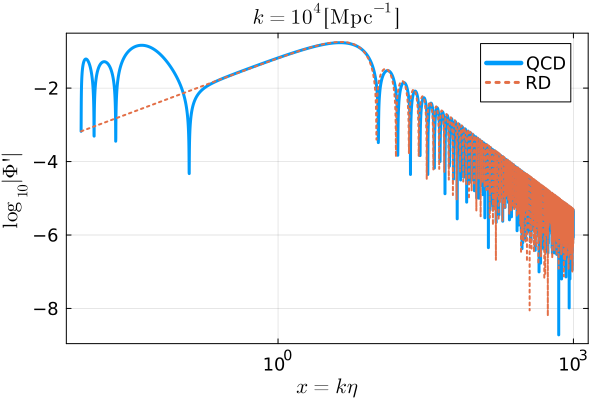

In [101]:
plot(scalarsol.t, log10.(abs.(hcat(scalarsol.u...)[1+length(kList),:])), xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|\Phi'|$", title=L"$k = 10^4\, [\mathrm{Mpc}^{-1}]$", label="QCD", legend=true)
plot!(scalarsol.t, map(x -> log10(abs(PhipRD(big(x)))), scalarsol.t), label="RD", linewidth=:2, linestyle=:dot)

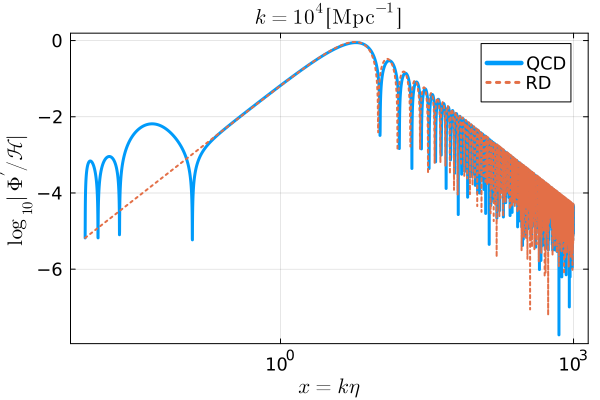

In [103]:
plot(scalarsol.t, [log10(abs(scalarsol.u[i][1+length(kList)] / calHint(scalarsol.t[i]))) for i=1:length(scalarsol.t)], xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|\Phi^\prime/\mathcal{H}|$", 
    title=L"$k = 10^4\, [\mathrm{Mpc}^{-1}]$", label="QCD", legend=true)
plot!(scalarsol.t, map(x -> log10(abs(PhipRD(big(x)) / calHint(x))), scalarsol.t), label="RD", linewidth=:2, linestyle=:dot)

In [105]:
writedlm("data/scalar.csv", vcat(hcat(scalarsol.t...),hcat(scalarsol.u...)), ',');

## load

In [107]:
PhiRD1(x) = 9/x^2 * (sin(x/sqrt(3))/(x/sqrt(3)) - cos(x/sqrt(3))); # Phi in exact RD
PhiRD2(x) = 9/x^2 * (cos(x/sqrt(3))/(x/sqrt(3)) + sin(x/sqrt(3)));
PhipRD1(x) = ForwardDiff.derivative(PhiRD1,x);
PhipRD2(x) = ForwardDiff.derivative(PhiRD2,x);
MPhi(x) = [PhiRD1(x) PhiRD2(x); PhipRD1(x) PhipRD2(x)];
PhiRDc(x,xc,Phic,Pic) = (MPhi(x)*inv(MPhi(xc))*[Phic,Pic])[1];
PhipRDc(x,xc,Phic,Pic) = (MPhi(x)*inv(MPhi(xc))*[Phic,Pic])[2];

In [109]:
kmin = 1e4;
kmax = 1e9;
kList = [10^lnk for lnk=log10(kmin):0.01:log10(kmax)];
lnkList = log10.(kList);

xi = 1e-2;
xf = 1000; #400;

scalardata = readdlm("data/scalar.csv", ',');
xList = scalardata[1,:];
PhiList = scalardata[2:1+length(kList),:];
PiList = scalardata[2+length(kList):size(scalardata)[1],:];

PhiCSI = Spline2D(lnkList,xList,PhiList,kx=3,ky=3);
PiCSI = Spline2D(lnkList,xList,PiList,kx=3,ky=3);

function Phiint(k,x) 
    if x < xi
        return PhiRD1(x)
    elseif x > xf
        return PhiRDc(x,xf,PhiCSI(log10(k),xf),PiCSI(log10(k),xf))
    else 
        return PhiCSI(log10(k),x)
    end
end;

function Piint(k,x) 
    if x < xi
        return PhipRD1(x)
    elseif x > xf
        return PhipRDc(x,xf,PhiCSI(log10(k),xf),PiCSI(log10(k),xf))
    else 
        return PiCSI(log10(k),x)
    end
end;

In [110]:
lnxplotList = [10^lnx for lnx=-3:0.01:3];
xplotList = [x for x=xi:0.01:500];

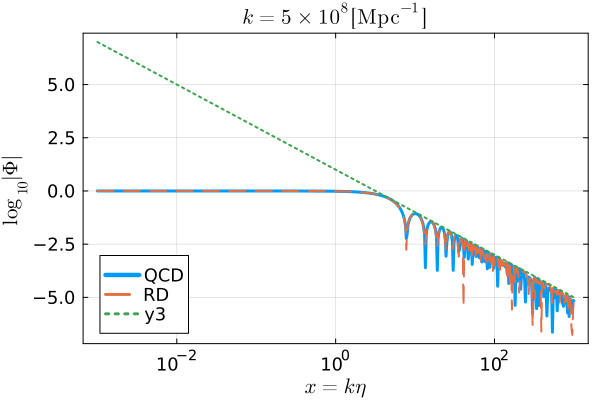

In [111]:
plot(lnxplotList, [log10(abs(Phiint(5e8,lnxplotList[i]))) for i=1:length(lnxplotList)], 
    xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|\Phi|$", 
    title=L"$k = 5\times10^8\,[\mathrm{Mpc}^{-1}]$", legend=:bottomleft, label="QCD")
plot!(lnxplotList, [log10(abs(PhiRD1(lnxplotList[i]))) for i=1:length(lnxplotList)], label="RD", linestyle=:dash, linewidth=:2)
plot!(lnxplotList, [log10(10*lnxplotList[i]^-2) for i=1:length(lnxplotList)], linestyle=:dot, linewidth=:2)

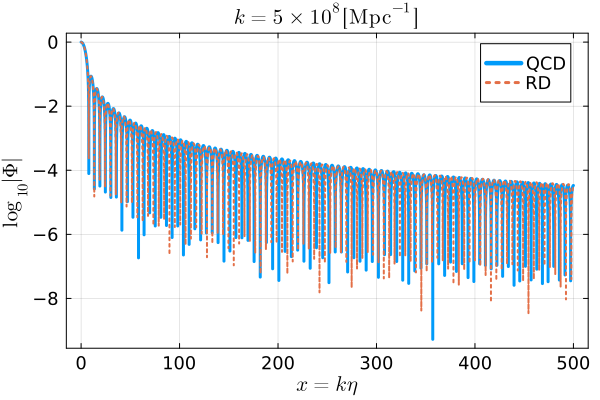

In [115]:
plot(xplotList, [log10(abs(Phiint(5e8,xplotList[i]))) for i=1:length(xplotList)], 
    xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|\Phi|$", 
    title=L"$k = 5\times10^8\,[\mathrm{Mpc}^{-1}]$", legend=true, label="QCD")
plot!(xplotList, [log10(abs(PhiRD1(xplotList[i]))) for i=1:length(xplotList)], label="RD", linestyle=:dot, linewidth=:2)

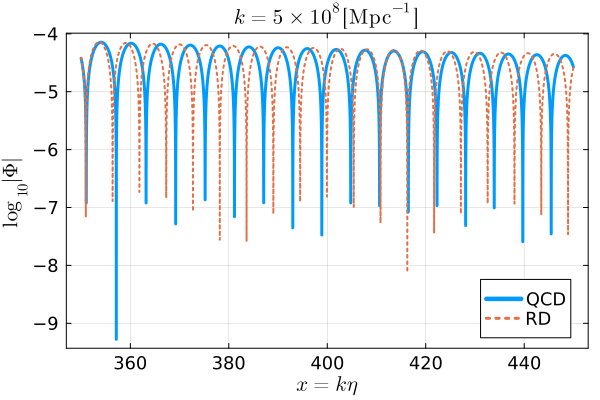

In [116]:
xzoom  = [x for x=350:0.01:450];

plot(xzoom, [log10(abs(Phiint(5e8,xzoom[i]))) for i=1:length(xzoom)], 
    xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|\Phi|$", 
    title=L"$k = 5\times10^8\,[\mathrm{Mpc}^{-1}]$", legend=true, label="QCD")
plot!(xzoom, [log10(abs(PhiRD1(xzoom[i]))) for i=1:length(xzoom)], label="RD", linestyle=:dot, linewidth=:2)

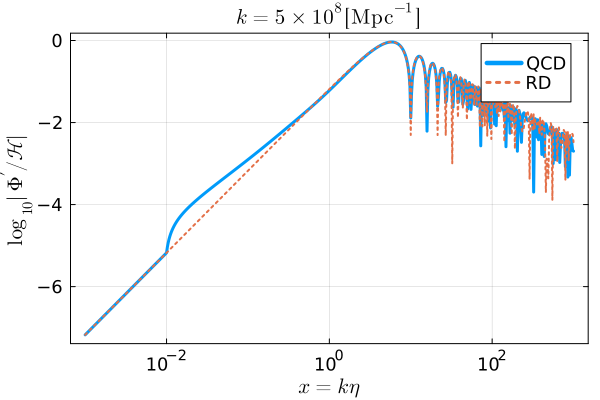

In [119]:
plot(lnxplotList, [log10(abs(Piint(5e8,big(lnxplotList[i]))*5e8 / calHint(lnxplotList[i]/5e8))) 
        for i=1:length(lnxplotList)], xscale=:log10, xlabel=L"$x = k\eta$", 
    ylabel=L"$\log_{10}|\Phi^\prime / \mathcal{H}|$", title=L"$k = 5\times10^8 \,[\mathrm{Mpc}^{-1}]$", legend=true, label="QCD")
plot!(lnxplotList, [log10(abs(PhipRD1(big(lnxplotList[i])) *lnxplotList[i])) 
        for i=1:length(lnxplotList)], label="RD", linestyle=:dot, linewidth=:2)

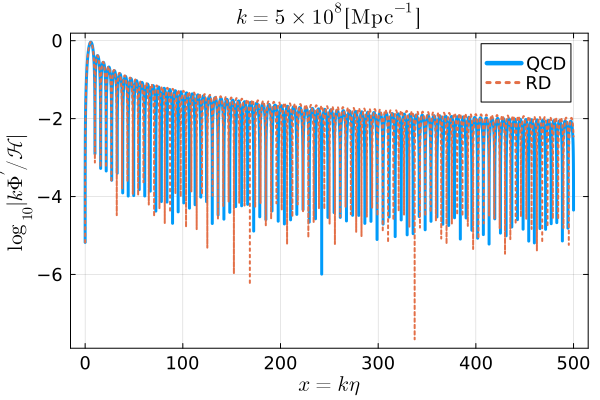

In [121]:
plot(xplotList, [log10(abs(Piint(5e8,big(xplotList[i])) *5e8 / calHint(xplotList[i]/5e8))) 
        for i=1:length(xplotList)], xlabel=L"$x = k\eta$", 
    ylabel=L"$\log_{10}|k\Phi^\prime / \mathcal{H}|$", title=L"$k = 5\times10^8 \,[\mathrm{Mpc}^{-1}]$", legend=true, label="QCD")
plot!(xplotList, [log10(abs(PhipRD1(big(xplotList[i])) *xplotList[i])) 
        for i=1:length(xplotList)], label="RD", linestyle=:dot, linewidth=:2)

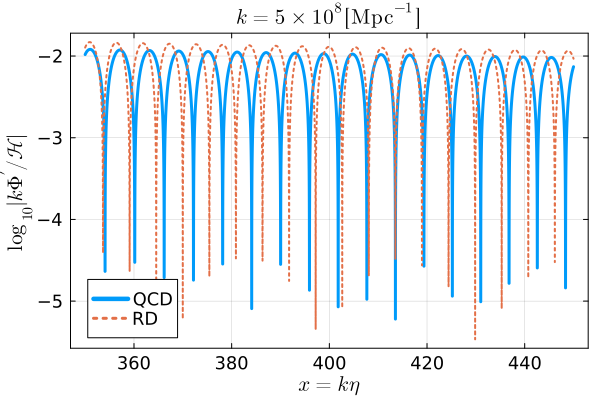

In [122]:
plot(xzoom, [log10(abs(Piint(5e8,big(xzoom[i])) *5e8 / calHint(xzoom[i]/5e8))) 
        for i=1:length(xzoom)], xlabel=L"$x = k\eta$", 
    ylabel=L"$\log_{10}|k\Phi^\prime / \mathcal{H}|$", title=L"$k = 5\times10^8 \,[\mathrm{Mpc}^{-1}]$", legend=true, label="QCD")
plot!(xzoom, [log10(abs(PhipRD1(big(xzoom[i])) *xzoom[i])) 
        for i=1:length(xzoom)], label="RD", linestyle=:dot, linewidth=:2)

In [124]:
aRD(eta) = eta/etaf*aint(etaf);

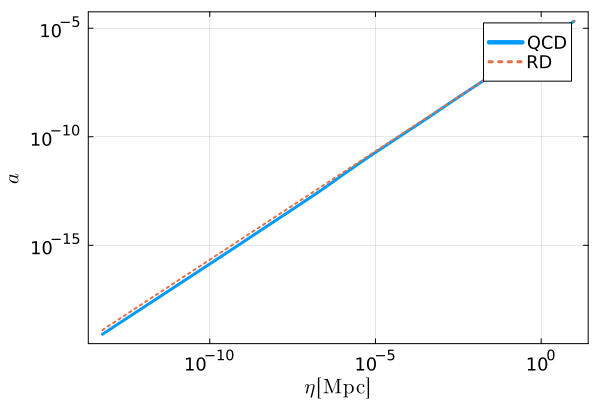

In [127]:
etalist = [10^lneta for lneta=log10(etai):0.01:log10(etaf)];

plot(aint, etalist, xscale=:log10, yscale=:log10, 
    xlabel=L"$\eta\,[\mathrm{Mpc}]$", ylabel=L"$a$", legend=true, label="QCD")
plot!(aRD, etalist, linestyle=:dot, linewidth=:2, label="RD")

In [129]:
ks = 1e8;
lnxzoom = [10^lnx for lnx=-2:0.01:2];

sourceQCD1e8(x) = aint(x/ks)* (2*Phiint(ks,x)*Phiint(ks,x) 
    + 4/3/(1+EoSwint(x/ks))*(Phiint(ks,x)+Piint(ks,x)*ks/calHint(x/ks))^2);

sourceRD1e8(x) = aRD(x/ks)* (2*PhiRD1(x)*PhiRD1(x) + (PhiRD1(x)+PhipRD1(x)*x)^2);

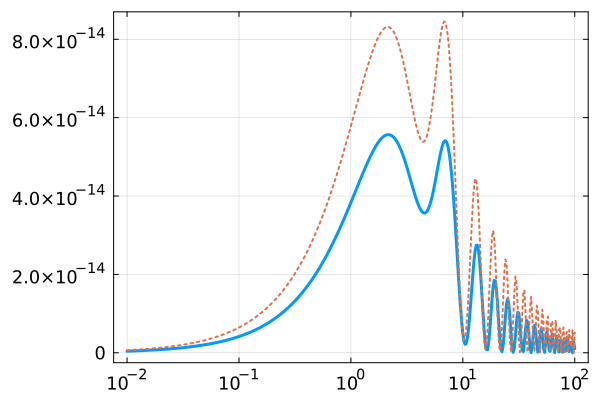

In [131]:
plot(lnxzoom, [sourceQCD1e8(lnxzoom[i]) for i=1:length(lnxzoom)], xscale=:log10)
plot!(lnxzoom, [sourceRD1e8(lnxzoom[i]) for i=1:length(lnxzoom)], linestyle=:dot, linewidth=:2)

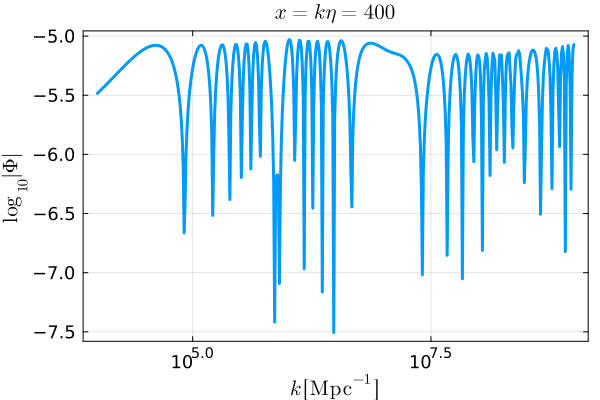

In [133]:
plot(kList, [log10(abs(Phiint(kList[i],xf))) for i=1:length(kList)], xscale=:log10, xlabel=L"$k\,[\mathrm{Mpc}^{-1}]$", ylabel=L"$\log_{10}|\Phi|$", title=L"$x = k\eta = 400$")

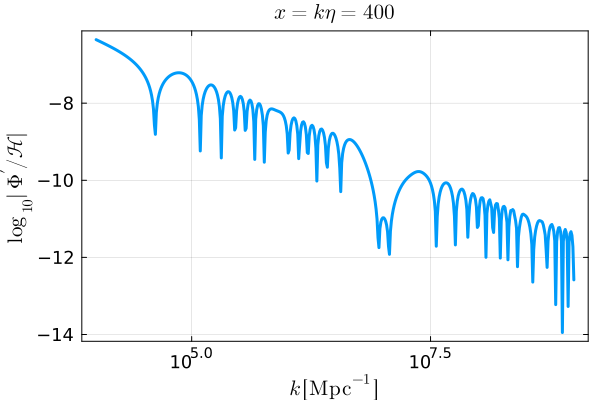

In [135]:
plot(kList, [log10(abs(Piint(kList[i],xf) / calHint(xf/kList[i]))) for i=1:length(kList)], xscale=:log10, xlabel=L"$k \,[\mathrm{Mpc}^{-1}]$", ylabel=L"$\log_{10}|\Phi^\prime / \mathcal{H}|$", 
    title=L"$x = k\eta = 400$")

# Tensor

## calculation

In [137]:
kmin = 1e4;
kmax = 1e9;
kList = [10^lnk for lnk=log10(kmin):0.01:log10(kmax)];
lnkList = log10.(kList);

xi = 1e-2;
xf = 1000; #400;

In [139]:
function gkEoM(du,u,p,x) # u[i] = g, u[i+length(kList)] = dgdx, p[i] = k
    for i=1:length(kList)
        du[i] = u[i+length(kList)]
        du[i+length(kList)] = - (1 - (1-3*EoSwint(x/p[i]))/2*calHint(x/p[i])^2/p[i]^2)*u[i]
    end
end;

xspan = (xi, xf);

In [141]:
g1RD(x) = cos(x);
g1pRD(x) = -sin(x);
g2RD(x) = sin(x);
g2pRD(x) = cos(x);

In [143]:
ui1 = vcat([g1RD(xi) for i=1:length(kList)], [g1pRD(xi) for i=1:length(kList)]);
ui2 = vcat([g2RD(xi) for i=1:length(kList)], [g2pRD(xi) for i=1:length(kList)]);

g1prob = ODEProblem(gkEoM,ui1,xspan,kList);
g2prob = ODEProblem(gkEoM,ui2,xspan,kList);

@time g1sol = solve(g1prob,Tsit5(),reltol=1e-10,abstol=1e-10);
@time g2sol = solve(g2prob,Tsit5(),reltol=1e-10,abstol=1e-10);

159.867115 seconds (2.56 G allocations: 41.655 GiB, 2.34% gc time, 0.03% compilation time)
140.795367 seconds (2.24 G allocations: 36.381 GiB, 2.34% gc time)


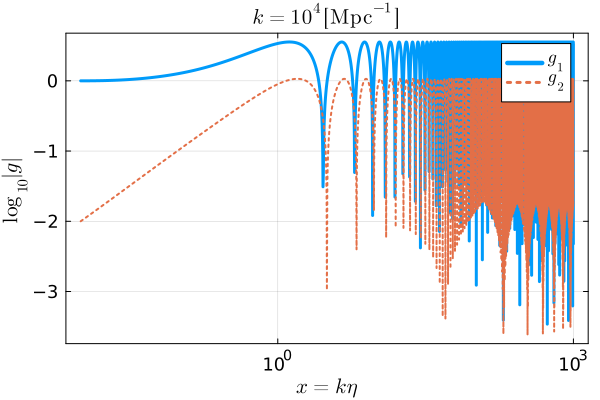

In [144]:
plot(g1sol.t, log10.(abs.(hcat(g1sol.u...)[1,:])), xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|g|$", title=L"$k = 10^4\, [\mathrm{Mpc}^{-1}]$", label=L"$g_1$", 
    legend=true)
plot!(g2sol.t, log10.(abs.(hcat(g2sol.u...)[1,:])), label=L"$g_2$", linestyle=:dot, linewidth=:2)

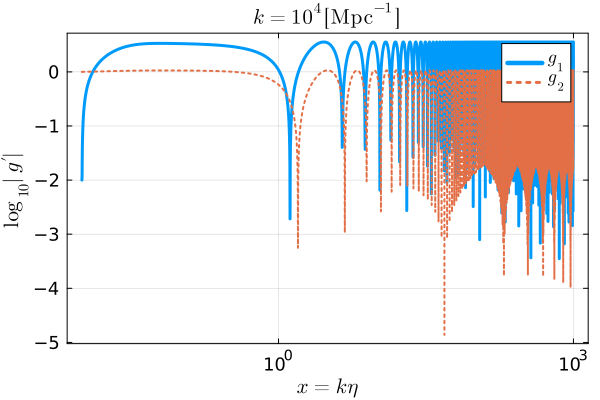

In [147]:
plot(g1sol.t, log10.(abs.(hcat(g1sol.u...)[1+length(kList),:])), xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|g^\prime|$", title=L"$k = 10^4\, [\mathrm{Mpc}^{-1}]$", label=L"$g_1$", 
    legend=true)
plot!(g2sol.t, log10.(abs.(hcat(g2sol.u...)[1+length(kList),:])), xscale=:log10, label=L"$g_2$", linestyle=:dot, linewidth=:2)

In [149]:
writedlm("data/g1.csv", vcat(hcat(g1sol.t...),hcat(g1sol.u...)), ',');
writedlm("data/g2.csv", vcat(hcat(g2sol.t...),hcat(g2sol.u...)), ',');

In [151]:
hkRD(x) = sin(x)/x;
hpRD(x) = ForwardDiff.derivative(hkRD,x);

In [153]:
function hkEoM(du,u,p,x) # u[i] = h, u[i+length(kList)] = dhdx, p[i] = k
    for i=1:length(kList)
        du[i] = u[i+length(kList)]
        du[i+length(kList)] = -2*calHint(x/p[i])/p[i]*u[i+length(kList)] - u[i]
    end
end;

xspan = (xi, xf);
ui = vcat([hkRD(xi) for i=1:length(kList)], [hpRD(xi) for i=1:length(kList)]);

hkprob = ODEProblem(hkEoM,ui,xspan,kList);

In [155]:
@time hksol = solve(hkprob,Tsit5(),reltol=1e-10,abstol=1e-10);

 31.803737 seconds (497.59 M allocations: 8.441 GiB, 2.44% gc time, 0.18% compilation time)


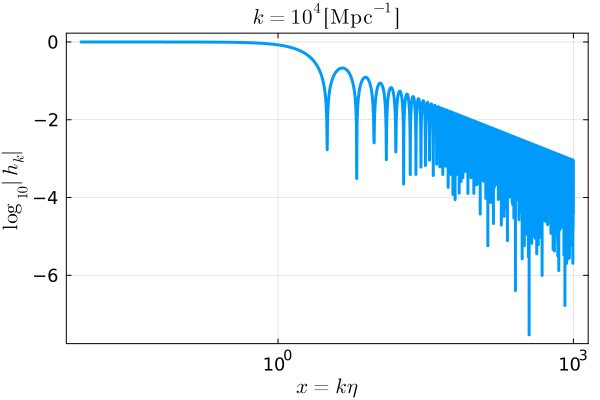

In [161]:
plot(hksol.t, log10.(abs.(hcat(hksol.u...)[1,:])), xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|h_k|$", title=L"$k = 10^4\, [\mathrm{Mpc}^{-1}]$")

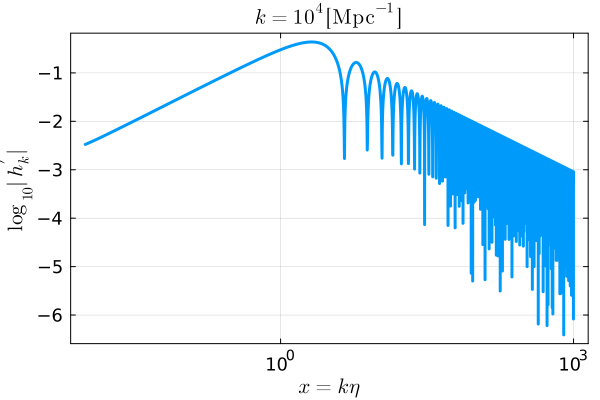

In [163]:
plot(hksol.t, log10.(abs.(hcat(hksol.u...)[1+length(kList),:])), xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|h_k^\prime|$", title=L"$k = 10^4\, [\mathrm{Mpc}^{-1}]$")

In [165]:
writedlm("data/hk.csv", vcat(hcat(hksol.t...),hcat(hksol.u...)), ',');

In [166]:
g1data = readdlm("data/g1.csv",',');
x1List = g1data[1,:];
g1List = g1data[2:1+length(kList),:];
g1pList = g1data[2+length(kList):size(g1data)[1],:];

g2data = readdlm("data/g2.csv",',');
x2List = g2data[1,:];
g2List = g2data[2:1+length(kList),:];
g2pList = g2data[2+length(kList):size(g2data)[1],:];

g1CSI = Spline2D(lnkList,x1List,g1List,kx=3,ky=3);
g1pCSI = Spline2D(lnkList,x1List,g1pList,kx=3,ky=3);
g2CSI = Spline2D(lnkList,x2List,g2List,kx=3,ky=3);
g2pCSI = Spline2D(lnkList,x2List,g2pList,kx=3,ky=3);

g1int(k,x) = g1CSI(log10(k),x);
g1pint(k,x) = g1pCSI(log10(k),x);
g2int(k,x) = g2CSI(log10(k),x);
g2pint(k,x) = g2pCSI(log10(k),x);

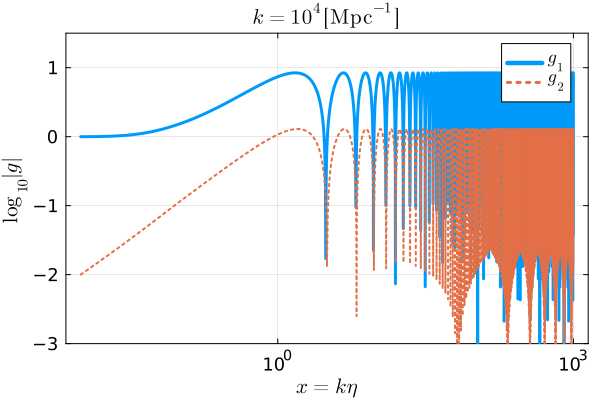

In [168]:
plot(x1List, [log10(abs(g1int(1e5,x1List[i]))) for i=1:length(x1List)], xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|g|$", title=L"$k = 10^4\, [\mathrm{Mpc}^{-1}]$", label=L"$g_1$", 
    ylims=(-3,1.5), legend=true)
plot!(x2List, [log10(abs(g2int(1e5,x2List[i]))) for i=1:length(x2List)], xscale=:log10, label=L"$g_2$", linestyle=:dot, linewidth=:2)

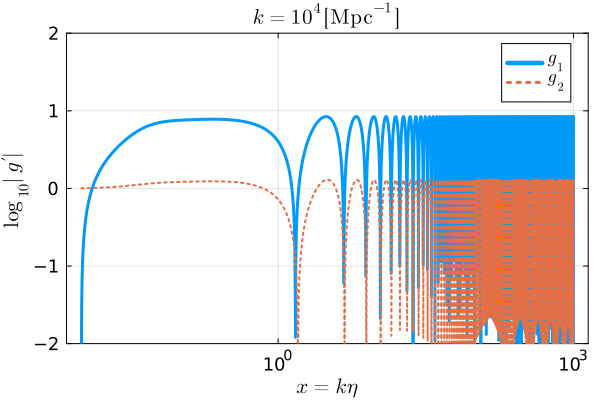

In [169]:
plot(x1List, [log10(abs(g1pint(1e5,x1List[i]))) for i=1:length(x1List)], xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|g^\prime|$", title=L"$k = 10^4\, [\mathrm{Mpc}^{-1}]$", label=L"$g_1$", 
    ylims=(-2,2), legend=true)
plot!(x2List, [log10(abs(g2pint(1e5,x2List[i]))) for i=1:length(x2List)], xscale=:log10, label=L"$g_2$", linestyle=:dot, linewidth=:2)

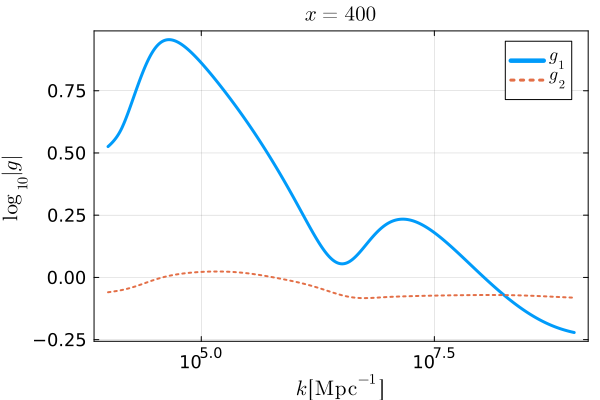

In [170]:
plot(kList, [log10(abs(g1int(kList[i],xf))) for i=1:length(kList)], xscale=:log10, xlabel=L"$k [\mathrm{Mpc}^{-1}]$", ylabel=L"$\log_{10}|g|$", title=L"$x = 400$", label=L"$g_1$", legend=true)
plot!(kList, [log10(abs(g2int(kList[i],xf))) for i=1:length(kList)], xscale=:log10, label=L"$g_2$", linestyle=:dot, linewidth=:2)

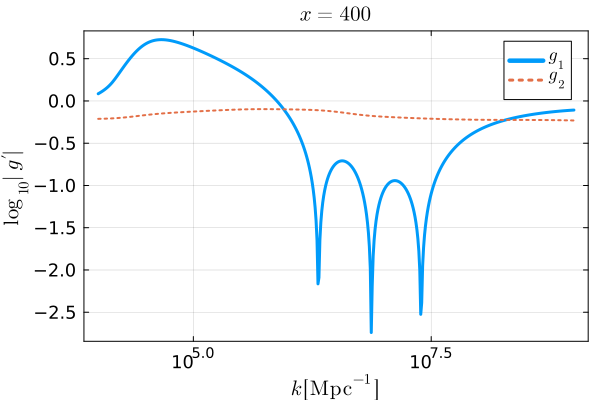

In [171]:
plot(kList, [log10(abs(g1pint(kList[i],xf))) for i=1:length(kList)], xscale=:log10, xlabel=L"$k [\mathrm{Mpc}^{-1}]$", ylabel=L"$\log_{10}|g^\prime|$", title=L"$x = 400$", label=L"$g_1$", legend=true)
plot!(kList, [log10(abs(g2pint(kList[i],xf))) for i=1:length(kList)], xscale=:log10, label=L"$g_2$", linestyle=:dot, linewidth=:2)

In [172]:
normNk(k,x) = g1pint(k,x)g2int(k,x)-g2pint(k,x)g1int(k,x);

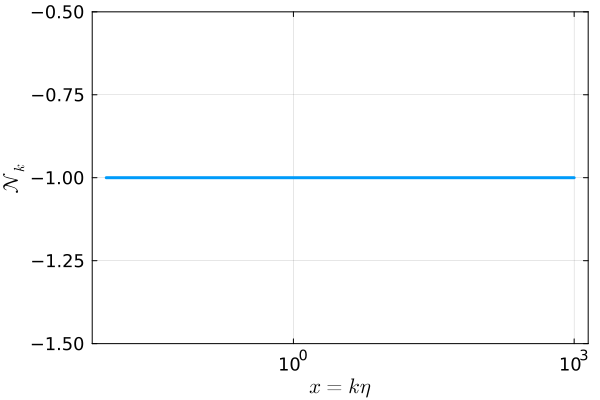

In [173]:
plot(x1List, [normNk(1e5,x1List[i]) for i=1:length(x1List)], xscale=:log10, ylims=(-1.5,-0.5), xlabel=L"$x = k\eta$", ylabel=L"$\mathcal{N}_k$")

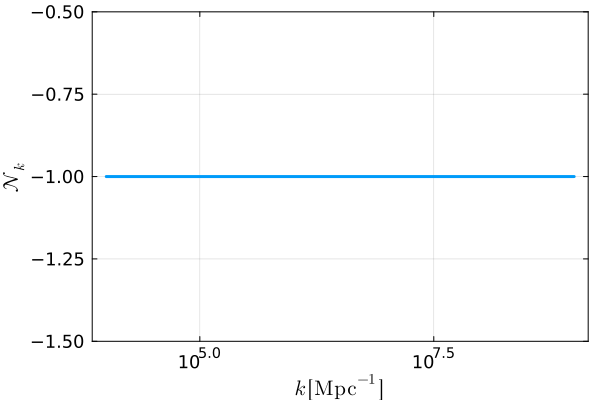

In [174]:
plot(kList, [normNk(kList[i],xi) for i=1:length(kList)], xscale=:log10, ylims=(-1.5,-0.5), xlabel=L"$k\,[\mathrm{Mpc}^{-1}]$", ylabel=L"$\mathcal{N}_k$")

In [175]:
dx = 2*2*π;

function g1g1bar(k)
    f(x) = g1int(k,x)*g1int(k,x)
    return quadgk(f,xf-dx,xf)[1]/dx
end;

function g2g2bar(k)
    f(x) = g2int(k,x)*g2int(k,x)
    return quadgk(f,xf-dx,xf)[1]/dx
end;

function g1g2bar(k)
    f(x) = g1int(k,x)*g2int(k,x)
    return quadgk(f,xf-dx,xf)[1]/dx
end;

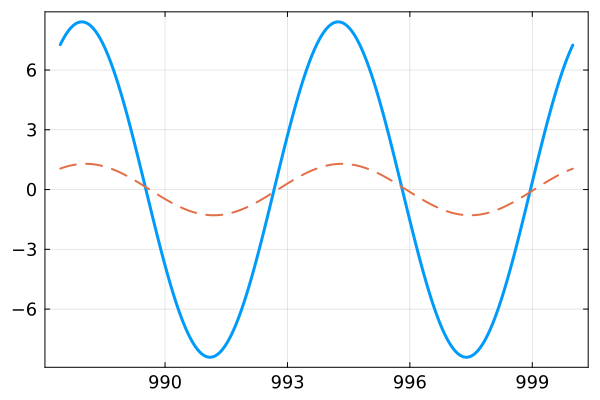

In [176]:
lastxList = [x for x=xf-dx:0.01:xf];

plot(lastxList, [g1int(1e5,lastxList[i]) for i=1:length(lastxList)])
plot!(lastxList, [g2int(1e5,lastxList[i]) for i=1:length(lastxList)], linestyle=:dash, linewidth=:2)

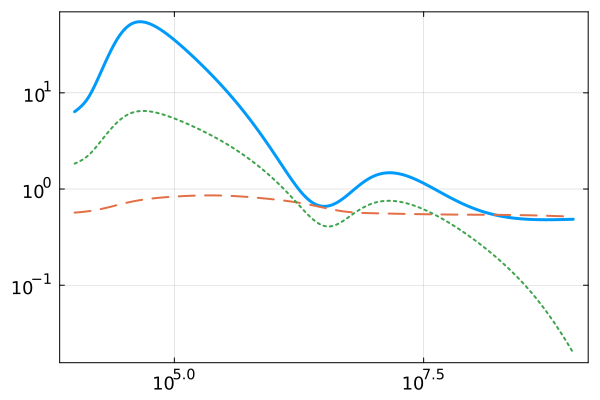

In [177]:
plot(kList, [g1g1bar(kList[i]) for i=1:length(kList)], xscale=:log10, yscale=:log10)
plot!(kList, [g2g2bar(kList[i]) for i=1:length(kList)], linestyle=:dash, linewidth=:2)
plot!(kList, [g1g2bar(kList[i]) for i=1:length(kList)], linestyle=:dot, linewidth=:2)

In [178]:
hkdata = readdlm("data/hk.csv",',');
xList = hkdata[1,:];
hkList = hkdata[2:1+length(kList),:];
hpList = hkdata[2+length(kList):size(hkdata)[1],:];

hkCSI = Spline2D(lnkList,xList,hkList,kx=3,ky=3);
hpCSI = Spline2D(lnkList,xList,hpList,kx=3,ky=3);

hint(k,x) = hkCSI(log10(k),x);
hpint(k,x) = hpCSI(log10(k),x);

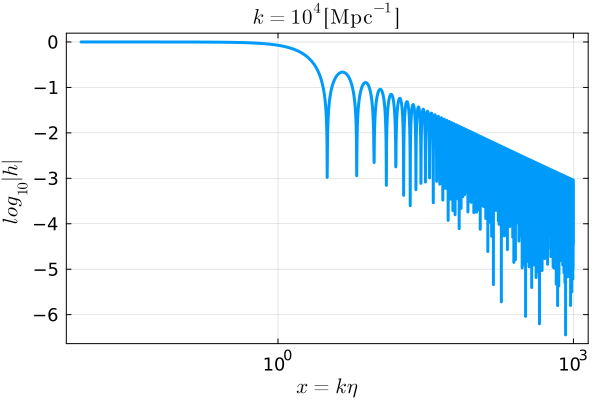

In [179]:
plot(xList, [log10(abs(hint(1e5,xList[i]))) for i=1:length(xList)], xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$log_{10}|h|$", title=L"$k = 10^4\, [\mathrm{Mpc}^{-1}]$")

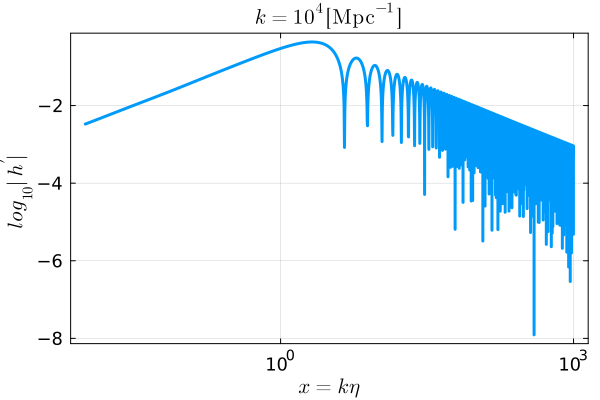

In [180]:
plot(xList, [log10(abs(hpint(1e5,xList[i]))) for i=1:length(xList)], xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$log_{10}|h^\prime|$", title=L"$k = 10^4\, [\mathrm{Mpc}^{-1}]$")

In [181]:
dx = 2*2*π;

function h2bar(k)
    f(x) = hint(k,x)*hint(k,x)
    return quadgk(f,xf-dx,xf)[1]/dx
end;

In [182]:
hRD(x) = sin(x)/x;
h2intRD(x) = hRD(x)*hRD(x);
h2barRD = quadgk(h2intRD,xf-dx,xf)[1]/dx

5.068373625740618e-7

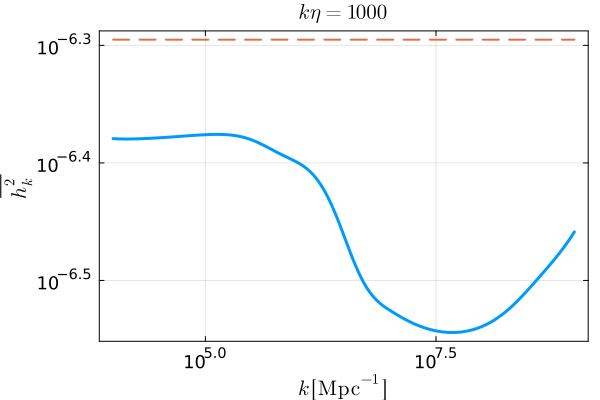

In [207]:
plot(kList, [h2bar(kList[i]) for i=1:length(kList)], xscale=:log10, yscale=:log10, ylabel=L"\overline{h_k^2}", xlabel=L"k\,[\mathrm{Mpc}^{-1}]", title=L"k\eta=1000")
plot!(kList, [h2barRD for i=1:length(kList)], linestyle=:dash, linewidth=:2)

In [209]:
h2barRD/h2bar(1e5)

1.204667886402924

In [185]:
g1g1List = [g1g1bar(kList[i]) for i=1:length(kList)];
g1g2List = [g1g2bar(kList[i]) for i=1:length(kList)];
g2g2List = [g2g2bar(kList[i]) for i=1:length(kList)];
coeffList = [(aint(xf/kList[i])*calHint(xf/kList[i])/aint(etaf)/calHint(etaf))^2 /24*(kList[i]/calHint(xf/kList[i]))^2 #*64/81/aint(xf/kList[i])^2 
    for i=1:length(kList)];
OlinList = [(aint(xf/kList[i])*calHint(xf/kList[i])/aint(etaf)/calHint(etaf))^2 /12*(kList[i]/calHint(xf/kList[i]))^2 * h2bar(kList[i]) for i=1:length(kList)];

In [186]:
writedlm("data/g1g2coeff.csv", hcat(log10.(kList),g1g1List,g1g2List,g2g2List,coeffList,OlinList), ',');

## load

In [253]:
g1RD(x) = cos(x);
g1pRD(x) = -sin(x);
g2RD(x) = sin(x);
g2pRD(x) = cos(x);
Mg(x) = [g1RD(x) g2RD(x); g1pRD(x) g2pRD(x)];
gRDc(x,xc,gc,gpc) = (Mg(x)*inv(Mg(xc))*[gc,gpc])[1];
gpRDc(x,xc,gc,gpc) = (Mg(x)*inv(Mg(xc))*[gc,gpc])[2];

In [255]:
kmin = 1e4;
kmax = 1e9;
kList = [10^lnk for lnk=log10(kmin):0.01:log10(kmax)];
lnkList = log10.(kList);

xi = 1e-2;
xf = 1000; #400;

g1data = readdlm("data/g1.csv", ',');
x1List = g1data[1,:];
g1List = g1data[2:1+length(kList),:];
g1pList = g1data[2+length(kList):size(g1data)[1],:];

g2data = readdlm("data/g2.csv", ',');
x2List = g2data[1,:];
g2List = g2data[2:1+length(kList),:];
g2pList = g2data[2+length(kList):size(g2data)[1],:];

g1CSI = Spline2D(lnkList,x1List,g1List,kx=3,ky=3);
g1pCSI = Spline2D(lnkList,x1List,g1pList,kx=3,ky=3);
g2CSI = Spline2D(lnkList,x2List,g2List,kx=3,ky=3);
g2pCSI = Spline2D(lnkList,x2List,g2pList,kx=3,ky=3);

function g1int(k,x) 
    if x < xi
        return g1RD(x)
    elseif x > xf
        return gRDc(x,xf,g1CSI(log10(k),xf),g1pCSI(log10(k),xf))
    else 
        return g1CSI(log10(k),x)
    end
end;

function g1pint(k,x) 
    if x < xi
        return g1pRD(x)
    elseif x > xf
        return gpRDc(x,xf,g1CSI(log10(k),xf),g1pCSI(log10(k),xf))
    else 
        return g1pCSI(log10(k),x)
    end
end;

function g2int(k,x) 
    if x < xi
        return g2RD(x)
    elseif x > xf
        return gRDc(x,xf,g2CSI(log10(k),xf),g2pCSI(log10(k),xf))
    else 
        return g2CSI(log10(k),x)
    end
end;

function g2pint(k,x) 
    if x < xi
        return g2pRD(x)
    elseif x > xf
        return gpRDc(x,xf,g2CSI(log10(k),xf),g2pCSI(log10(k),xf))
    else 
        return g2pCSI(log10(k),x)
    end
end;

In [256]:
xplotList = [10^lnx for lnx=-3:0.01:3];

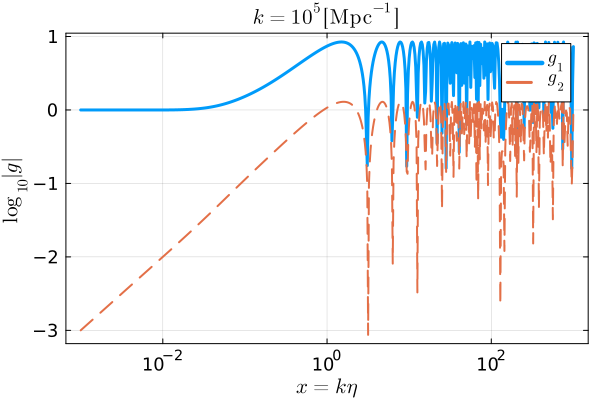

In [257]:
plot(xplotList, [log10(abs(g1int(1e5,xplotList[i]))) for i=1:length(xplotList)], xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|g|$", title=L"$k = 10^5\, [\mathrm{Mpc}^{-1}]$", 
    label=L"$g_1$", legend=true)
plot!(xplotList, [log10(abs(g2int(1e5,xplotList[i]))) for i=1:length(xplotList)], xscale=:log10, label=L"$g_2$", linestyle=:dash, linewidth=:2)

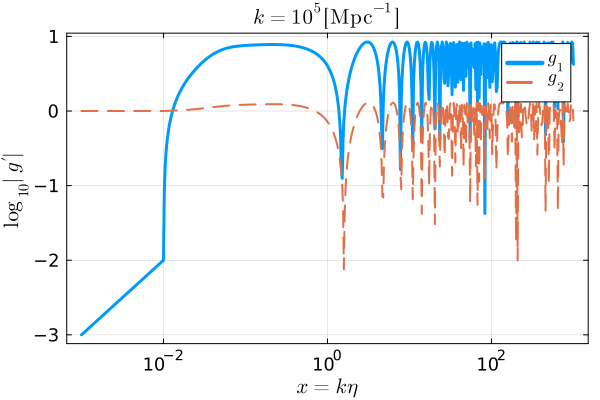

In [261]:
plot(xplotList, [log10(abs(g1pint(1e5,xplotList[i]))) for i=1:length(xplotList)], xscale=:log10, xlabel=L"$x = k\eta$", ylabel=L"$\log_{10}|g^\prime|$", title=L"$k = 10^5\, [\mathrm{Mpc}^{-1}]$", 
    label=L"$g_1$", legend=true)
plot!(xplotList, [log10(abs(g2pint(1e5,xplotList[i]))) for i=1:length(xplotList)], xscale=:log10, label=L"$g_2$", linestyle=:dash, linewidth=:2)

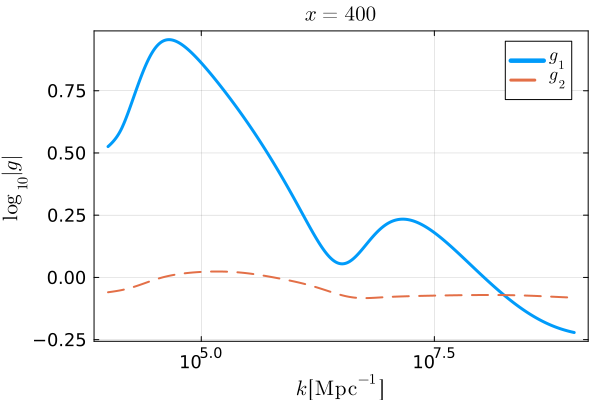

In [263]:
plot(kList, [log10(abs(g1int(kList[i],xf))) for i=1:length(kList)], xscale=:log10, xlabel=L"$k [\mathrm{Mpc}^{-1}]$", ylabel=L"$\log_{10}|g|$", title=L"$x = 400$", label=L"$g_1$", legend=true)
plot!(kList, [log10(abs(g2int(kList[i],xf))) for i=1:length(kList)], xscale=:log10, label=L"$g_2$", linestyle=:dash, linewidth=:2)

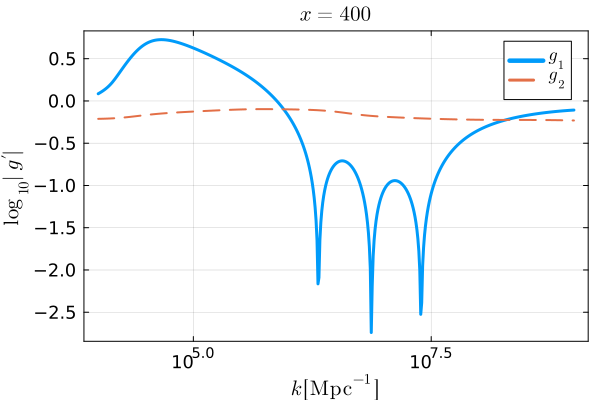

In [265]:
plot(kList, [log10(abs(g1pint(kList[i],xf))) for i=1:length(kList)], xscale=:log10, xlabel=L"$k [\mathrm{Mpc}^{-1}]$", ylabel=L"$\log_{10}|g^\prime|$", title=L"$x = 400$", label=L"$g_1$", legend=true)
plot!(kList, [log10(abs(g2pint(kList[i],xf))) for i=1:length(kList)], xscale=:log10, label=L"$g_2$", linestyle=:dash, linewidth=:2)

In [267]:
coeffdata = readdlm("data/g1g2coeff.csv", ',');

lnkList = coeffdata[:,1];
g1g1List = coeffdata[:,2];
g1g2List = coeffdata[:,3];
g2g2List = coeffdata[:,4];
coeffList = coeffdata[:,5];
OlinList = coeffdata[:,6];

In [269]:
g1g1CSI = Spline1D(lnkList, g1g1List, k=3);
g1g1int(k) = g1g1CSI(log10(k));

g1g2CSI = Spline1D(lnkList, g1g2List, k=3);
g1g2int(k) = g1g2CSI(log10(k));

g2g2CSI = Spline1D(lnkList, g2g2List, k=3);
g2g2int(k) = g2g2CSI(log10(k));

coeffCSI = Spline1D(lnkList, coeffList, k=3);
coeffint(k) = coeffCSI(log10(k));

OlinCSI = Spline1D(lnkList, OlinList, k=3);
Olinint(k) = OlinCSI(log10(k));

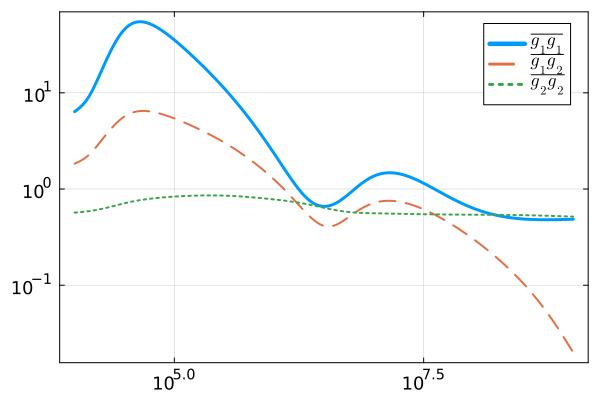

In [271]:
plot(kList, [g1g1int(kList[i]) for i=1:length(kList)], xscale=:log10, yscale=:log10, legend=true, label=L"\overline{g_1g_1}")
plot!(kList, [g1g2int(kList[i]) for i=1:length(kList)], label=L"\overline{g_1g_2}", linestyle=:dash, linewidth=:2)
plot!(kList, [g2g2int(kList[i]) for i=1:length(kList)], label=L"\overline{g_2g_2}", linestyle=:dot, linewidth=:2)

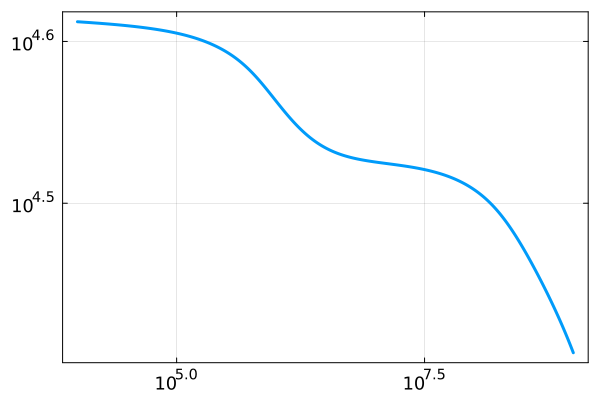

In [273]:
plot(kList, [coeffint(kList[i]) for i=1:length(kList)], xscale=:log10, yscale=:log10)

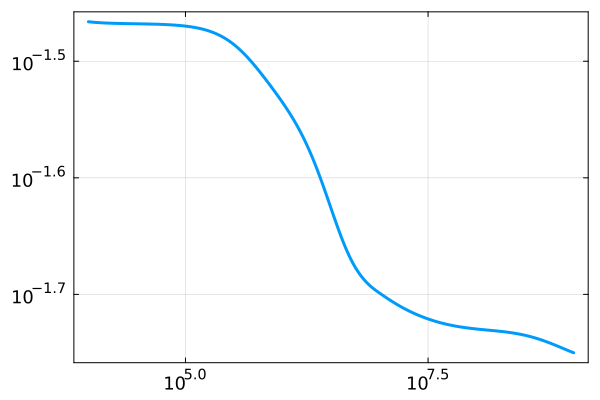

In [275]:
plot(kList, [Olinint(kList[i]) for i=1:length(kList)], xscale=:log10, yscale=:log10)

In [277]:
kIR = 1e6;

g1int(kIR,kIR/5e8)^2*g2g2int(kIR) - 2*g1int(kIR,kIR/5e8)*g2int(kIR,kIR/5e8)*g1g2int(kIR) + g2int(kIR,kIR/5e8)^2*g1g1int(kIR)

0.7742363893789846

# Kernel

## calculation

In [7]:
bgdata = readdlm("data/bg.csv", ',');

etaList = bgdata[:,1];
anormList = bgdata[:,2];
calHList = bgdata[:,3];
EoSwList = bgdata[:,4];
cs2List = bgdata[:,5];
grhoList = bgdata[:,6];
gsList = bgdata[:,7];

In [9]:
lnetaList = log10.(etaList);
etai = etaList[1];
etaf = etaList[length(etaList)];

alneta = CubicSpline(anormList, lnetaList);
aint(eta) = alneta(log10(eta))
calHlneta = CubicSpline(calHList, lnetaList);
calHint(eta) = calHlneta(log10(eta));
EoSwlneta = CubicSpline(EoSwList, lnetaList);
EoSwint(eta) = EoSwlneta(log10(eta))
cs2lneta = CubicSpline(cs2List, lnetaList);
cs2int(eta) = cs2lneta(log10(eta));
grholneta = CubicSpline(grhoList, lnetaList);
grhoint(eta) = grholneta(log10(eta))
gslneta = CubicSpline(gsList, lnetaList);
gsint(eta) = gslneta(log10(eta));

In [10]:
PhiRD1(x) = 9/x^2 * (sin(x/sqrt(3))/(x/sqrt(3)) - cos(x/sqrt(3))); # Phi in exact RD
PhiRD2(x) = 9/x^2 * (cos(x/sqrt(3))/(x/sqrt(3)) + sin(x/sqrt(3)));
PhipRD1(x) = ForwardDiff.derivative(PhiRD1,x);
PhipRD2(x) = ForwardDiff.derivative(PhiRD2,x);
MPhi(x) = [PhiRD1(x) PhiRD2(x); PhipRD1(x) PhipRD2(x)];
PhiRDc(x,xc,Phic,Pic) = (MPhi(x)*inv(MPhi(xc))*[Phic,Pic])[1];
PhipRDc(x,xc,Phic,Pic) = (MPhi(x)*inv(MPhi(xc))*[Phic,Pic])[2];

In [13]:
kmin = 1e4;
kmax = 1e9;
kList = [10^lnk for lnk=log10(kmin):0.01:log10(kmax)];
lnkList = log10.(kList);

xi = 1e-2;
xf = 1000; #400;

scalardata = readdlm("data/scalar.csv", ',');
xList = scalardata[1,:];
PhiList = scalardata[2:1+length(kList),:];
PiList = scalardata[2+length(kList):size(scalardata)[1],:];

PhiCSI = Spline2D(lnkList,xList,PhiList,kx=3,ky=3);
PiCSI = Spline2D(lnkList,xList,PiList,kx=3,ky=3);

function Phiint(k,x) 
    if x < xi
        return PhiRD1(x)
    elseif x > xf
        return PhiRDc(x,xf,PhiCSI(log10(k),xf),PiCSI(log10(k),xf))
    else 
        return PhiCSI(log10(k),x)
    end
end;

function Piint(k,x) 
    if x < xi
        return PhipRD1(x)
    elseif x > xf
        return PhipRDc(x,xf,PhiCSI(log10(k),xf),PiCSI(log10(k),xf))
    else 
        return PiCSI(log10(k),x)
    end
end;

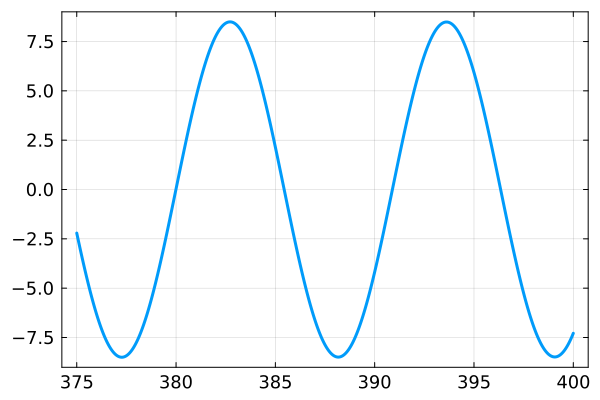

In [15]:
xzoom = [x for x=375:0.01:400];
plot(xzoom, map(x -> x^2*Phiint(1e5,x), xzoom))

In [17]:
g1RD(x) = cos(x);
g1pRD(x) = -sin(x);
g2RD(x) = sin(x);
g2pRD(x) = cos(x);
Mg(x) = [g1RD(x) g2RD(x); g1pRD(x) g2pRD(x)];
gRDc(x,xc,gc,gpc) = (Mg(x)*inv(Mg(xc))*[gc,gpc])[1];
gpRDc(x,xc,gc,gpc) = (Mg(x)*inv(Mg(xc))*[gc,gpc])[2];

In [19]:
kmin = 1e4;
kmax = 1e9;
kList = [10^lnk for lnk=log10(kmin):0.01:log10(kmax)];
lnkList = log10.(kList);

xi = 1e-2;
xf = 1000; #400;

g1data = readdlm("data/g1.csv", ',');
x1List = g1data[1,:];
g1List = g1data[2:1+length(kList),:];
g1pList = g1data[2+length(kList):size(g1data)[1],:];

g2data = readdlm("data/g2.csv", ',');
x2List = g2data[1,:];
g2List = g2data[2:1+length(kList),:];
g2pList = g2data[2+length(kList):size(g2data)[1],:];

g1CSI = Spline2D(lnkList,x1List,g1List,kx=3,ky=3);
g1pCSI = Spline2D(lnkList,x1List,g1pList,kx=3,ky=3);
g2CSI = Spline2D(lnkList,x2List,g2List,kx=3,ky=3);
g2pCSI = Spline2D(lnkList,x2List,g2pList,kx=3,ky=3);

function g1int(k,x) 
    if x < xi
        return g1RD(x)
    elseif x > xf
        return gRDc(x,xf,g1CSI(log10(k),xf),g1pCSI(log10(k),xf))
    else 
        return g1CSI(log10(k),x)
    end
end;

function g1pint(k,x) 
    if x < xi
        return g1pRD(x)
    elseif x > xf
        return gpRDc(x,xf,g1CSI(log10(k),xf),g1pCSI(log10(k),xf))
    else 
        return g1pCSI(log10(k),x)
    end
end;

function g2int(k,x) 
    if x < xi
        return g2RD(x)
    elseif x > xf
        return gRDc(x,xf,g2CSI(log10(k),xf),g2pCSI(log10(k),xf))
    else 
        return g2CSI(log10(k),x)
    end
end;

function g2pint(k,x) 
    if x < xi
        return g2pRD(x)
    elseif x > xf
        return gpRDc(x,xf,g2CSI(log10(k),xf),g2pCSI(log10(k),xf))
    else 
        return g2pCSI(log10(k),x)
    end
end;

In [20]:
coeffdata = readdlm("data/g1g2coeff.csv", ',');

lnkList = coeffdata[:,1];
g1g1List = coeffdata[:,2];
g1g2List = coeffdata[:,3];
g2g2List = coeffdata[:,4];
coeffList = coeffdata[:,5];
OlinList = coeffdata[:,6];

In [21]:
g1g1CSI = Spline1D(lnkList, g1g1List, k=3);
g1g1int(k) = g1g1CSI(log10(k));

g1g2CSI = Spline1D(lnkList, g1g2List, k=3);
g1g2int(k) = g1g2CSI(log10(k));

g2g2CSI = Spline1D(lnkList, g2g2List, k=3);
g2g2int(k) = g2g2CSI(log10(k));

coeffCSI = Spline1D(lnkList, coeffList, k=3);
coeffint(k) = coeffCSI(log10(k));

OlinCSI = Spline1D(lnkList, OlinList, k=3);
Olinint(k) = OlinCSI(log10(k));

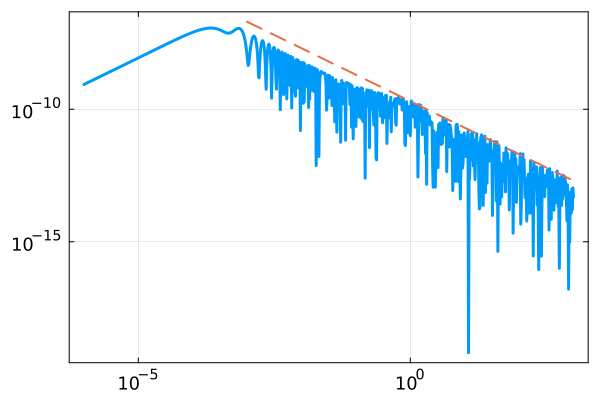

In [22]:
ks = 1e8;
kGW = 1e4;

I148int(x) = (4/9*aint(x/kGW)/aint(xf/kGW)*g1int(kGW,x) * (2*Phiint(ks,ks/kGW*x)^2
        + 4/3/(1+EoSwint(x/kGW))*(Phiint(ks,ks/kGW*x)+Piint(ks,ks/kGW*x)*ks/calHint(x/kGW))^2));

lnxplotList = [10^lnx for lnx=-6:0.01:log10(xf)];
lnxfit = [10^lnx for lnx=-3:0.01:log10(xf)];
plot(lnxplotList, map(x -> abs(I148int(x)), lnxplotList), xscale=:log10, yscale=:log10)
plot!(lnxfit, [2e-10*lnxfit[i]^-1 for i=1:length(lnxfit)], linestyle=:dash, linewidth=:2)

In [47]:
xWKB = 1

f1(eta) = 3*calHint(eta)*(1+cs2int(eta))
omegat(k,x) = sqrt(k^2 - calHint(x/k)^2*(1-3*EoSwint(x/k)))
omegatp(k,x) = k*ForwardDiff.derivative(xp -> omegat(k,xp), x)
omegas(k,x) = sqrt(cs2int(x/k)*k^2 + 3*calHint(x/k)^2*(cs2int(x/k)-EoSwint(x/k)))
omegasp(k,x) = k*ForwardDiff.derivative(xp -> omegas(k,xp), x)

function Omegaabc(k,s,t,x,alpha,beta,gamma)  # Omega/k
    u = (t+s+1)/2
    v = (t-s+1)/2
    k1 = u*k
    k2 = v*k
    
    return (alpha*omegat(k,x) + beta*omegas(k1,x) + gamma*omegas(k2,x))/k
end

function calOabc(k,s,t,x,alpha,beta,gamma) # calO/k
    u = (t+s+1)/2
    v = (t-s+1)/2
    k1 = u*k
    k2 = v*k

    eta = x/k
    
    return 4/9*aint(eta)/aint(xf/k) / 
        (3*calHint(eta)^2*(1+EoSwint(eta))*sqrt(omegat(k,x))*omegas(k1,x)^(3/2)*omegas(k2,x)^(3/2)) * 
        (2*calHint(eta)^2*(5+3*EoSwint(eta))*omegas(k1,x)*omegas(k2,x) + 
            (f1(eta)*omegas(k1,x) - 2*im*beta*omegas(k1,x)^2 + omegasp(k1,x)) * 
            (f1(eta)*omegas(k2,x) - 2*im*gamma*omegas(k2,x)^2 + omegasp(k2,x)) -
        2*calHint(eta)*(2*(f1(eta)-im*beta*omegas(k1,x)-im*gamma*omegas(k2,x))*omegas(k1,x)*omegas(k2,x) + 
            omegasp(k1,x)*omegas(k2,x) + omegas(k1,x)*omegasp(k2,x) ) ) #*exp(-quadgk(f1,etaWKB,eta;rtol=1e-10,atol=1e-10)[1])
end

#function phiabc(k,s,t,eta,alpha,beta,gamma)
#    etaWKB = xWKB/k

#    return quadgk(etap -> Omegaabc(k,s,t,etap,alpha,beta,gamma), etaWKB, eta; rtol=1e-10, atol=1e-10)[1]
#end

adiabaticity(k,s,t,x,alpha,beta,gamma) = abs((ForwardDiff.derivative(xp -> log(calOabc(k,s,t,xp,alpha,beta,gamma)), x)
        - f1(x/k)/k ) / Omegaabc(k,s,t,x,alpha,beta,gamma))

adiabaticity (generic function with 1 method)

In [24]:
adiabaticity(1e5,0,1e2,10,1,1,-1)

0.10230672825166748

In [63]:
g1int(1e5,10)

-5.074773274382217

In [61]:
D1alpha(1e5)' * [gkWKBp(1e5,10); gkWKBm(1e5,10)]

-8.396953814829262 + 6.986372491587356e-16im

In [81]:
omegatp(1e5,1)/1e5/omegat(1e5,1)

0.0009825977485551304

In [59]:
gkWKBp(k,x) = exp(im*quadgk(xp -> omegat(k,xp)/k, xWKB, x; rtol=1e-10, atol=1e-10)[1])/sqrt(omegat(k,x))
gkWKBm(k,x) = exp(-im*quadgk(xp -> omegat(k,xp)/k, xWKB, x; rtol=1e-10, atol=1e-10)[1])/sqrt(omegat(k,x))
gkWKBpp(k,x) = (im*omegat(k,x)/k - omegatp(k,x)/k/omegat(k,x)/2) * gkWKBp(k,x) #+ 
   # ForwardDiff.derivative(xp -> 1/sqrt(omegat(k,xp)), x) * exp(im*quadgk(xp -> omegat(k,xp)/k, xWKB, x; rtol=1e-10, atol=1e-10)[1])
gkWKBmp(k,x) = (-im*omegat(k,x)/k - omegatp(k,x)/k/omegat(k,x)/2) * gkWKBm(k,x) #+ 
   # ForwardDiff.derivative(xp -> 1/sqrt(omegat(k,xp)), x) * exp(-im*quadgk(xp -> omegat(k,xp)/k, xWKB, x; rtol=1e-10, atol=1e-10)[1])

D1alpha(k) = inv([gkWKBp(k,xWKB) gkWKBm(k,xWKB); gkWKBpp(k,xWKB) gkWKBmp(k,xWKB)]) * [g1int(k,xWKB); g1pint(k,xWKB)]
D2alpha(k) = inv([gkWKBp(k,xWKB) gkWKBm(k,xWKB); gkWKBpp(k,xWKB) gkWKBmp(k,xWKB)]) * [g2int(k,xWKB); g2pint(k,xWKB)]    

function calIabc(k,s,t,alpha,beta,gamma)
    phase(x) = quadgk(xp -> Omegaabc(k,s,t,x,alpha,beta,gamma), xWKB, x; rtol=1e-10, atol=1e-10)[1]
    amp(x) = quadgk(xp -> f1(xp/k)/k, xWKB, x; rtol=1e-10, atol=1e-10)[1]
    
    # u = calIabc, du = dcalIabc / dx
    ode(u,p,x) = calOabc(k,s,t,x,alpha,beta,gamma) * exp(-amp(x) + im*phase(x))
    
    prob = ODEProblem(ode, 0.0+0.0*im, (xWKB,xf))

    check_adi(u,x,integrator) = adiabaticity(k,s,t,x,alpha,beta,gamma) - 0.01
    EoI = ContinuousCallback(check_adi, terminate!)

    Isol = solve(prob, Tsit5(); callback=EoI, reltol=1e-10, abstol=1e-10, save_everystep=false)

    calIWKB(x) = calOabc(k,s,t,x,alpha,beta,gamma)/im/Omegaabc(k,s,t,x,alpha,beta,gamma) * exp(im*phase(x))
    
    return Isol.u[end] + calIWKB(xf) - calIWKB(Isol.t[end])
end

function I1(k,s,t)
    u = (t+s+1)/2
    v = (t-s+1)/2
    k1 = u*k
    k2 = v*k
    if (k1 < kmin || k1 > kmax || k2 < kmin || k2 > kmax)
        return 0
    else
        function f(x)
            x1 = k1/k*x
            x2 = k2/k*x
            eta = x/k
            return (4/9*aint(eta)/aint(xf/k)*g1int(k,x) * (2*Phiint(k1,x1)*Phiint(k2,x2) 
                    + 4/3/(1+EoSwint(eta))*(Phiint(k1,x1)+Piint(k1,x1)*k1/calHint(eta))*(Phiint(k2,x2)+Piint(k2,x2)*k2/calHint(eta))))
        end
        x1i = k/k1*xi
        x2i = k/k2*xi
        x1f = k/k1*xf
        x2f = k/k2*xf
            
        I1 = -quadgk(f,xi,xWKB)[1]

        for alpha in -1:2:1
            for beta in -1:2:1
                for gamma in -1:2:1
                    I1 -= calIabc(k,s,t,alpha,beta,gamma)
                end
            end
        end

        return I1
    end
end

I1 (generic function with 1 method)

In [120]:
I1(1e5,0,1e2)

0.05828570967605048 + 1.9081958235744878e-17im

In [118]:
@time calIabc(1e5,0,1e2,1,1,-1)

  1.027676 seconds (7.31 M allocations: 324.959 MiB, 1.48% gc time, 94.13% compilation time)


-0.010389106784791758 - 0.40366654829511267im